<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [ ]:
# импорты со всего ноутбука
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from sklearn.model_selection import train_test_split
from scipy.stats import spearmanr
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
from scipy.optimize import minimize
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder

random.seed(42)
np.random.seed(42)

In [ ]:
# Исходные данные
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

In [ ]:
df_train.to_csv("file.csv", index=False)

In [ ]:
# Данные после EDA (Часть 1)
edf_train = pd.read_csv("https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/mX5rpXdo0q4OXQ")
edf_test = pd.read_csv("https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/-CU126MgsYL7jA")

In [ ]:
# Данные с обработанным name
cdf_train = pd.read_csv("https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/oTw_K9HORENDdw")
cdf_test = pd.read_csv("https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/Ki4_gOnT4q7FXg")

In [ ]:
df_train.to_csv("my_df.csv", index=False)

### **Задание 0**
Для чего фиксируем сиды в домашках?

Для воспроизводимости результатов.


# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [ ]:
print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [ ]:
# столбцы с пропусками
df_train.isna().sum()[df_train.isna().sum() > 0]

,0
mileage,202
engine,202
max_power,196
torque,203
seats,202


In [ ]:
# дубликаты (есть)
df_train.duplicated().sum()

985

In [ ]:
df_train[df_train.duplicated(keep=False)].sort_values(by='name')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
1703,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
1836,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
6704,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
1337,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1468,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
3291,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5753,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
361,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0


In [ ]:
!pip install ydata_profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 48.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=69d19d503408ac2a3588e2d9a193b98f672819988311267259a2023cf813b97e
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport

ProfileReport(df_train, title="Отчет о профилировании данных", explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

> В наборе данных 13 переменных и 6999 наблюдений. Этого достаточное количество данных для обучения модели.

> Типы переменных:
* Текстовые переменные: 5
* Числовые переменные: 4
* Категориальные переменные: 4

> Общее количество пропущенных ячеек составляет 1005 (1.1% от общего количества).
Некоторые переменные, такие как mileage, engine, max_power, torque и seats, имеют пропуски (по 202-203 пропущенных значений). Можно применить какие-нибудь методы обработки пропущенных данных, например, заполнение средними значениями или удаление строк с пропусками.

> В наборе данных 493 дубликата (7.0%). Надо удалить дубликаты перед обучением модели, чтобы избежать искажений в результатах.

> Высокая корреляция между переменными km_driven и year, а также selling_price и transmission. Следует удлить сильно коррелирующие признаки.

> Переменная seller_type имеет достаточно высокий дисбаланс (51.8%). Стоит прменить какие-нибудь методы балансировки классов.

> Можно рассмотреть возможность создания новых признаков, таких как:
* Соотношение max_power к engine.
* Разница между year и текущим годом для создания переменной "возраст автомобиля".
* Создание бинарных переменных для категориальных признаков, таких как transmission (например, автоматическая/механическая).

> Основные признаки, которые стоит рассмотреть для линейной регрессии:
  1.   selling_price (целевая переменная)
  2.   km_driven
  3.   year
  4.   transmission
  5.   mileage
  6.   engine
  7.   max_power
  8.   torque
  9.   seats

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [ ]:
print("Статистики для трейна (числовые):")
print(df_train.describe())
print("\nСтатистики для теста (числовые):")
print(df_test.describe())

Статистики для трейна (числовые):
              year  selling_price     km_driven        seats
count  6999.000000   6.999000e+03  6.999000e+03  6797.000000
mean   2013.818403   6.395152e+05  6.958462e+04     5.419008
std       4.053095   8.089419e+05  5.772400e+04     0.965767
min    1983.000000   2.999900e+04  1.000000e+00     2.000000
25%    2011.000000   2.549990e+05  3.500000e+04     5.000000
50%    2015.000000   4.500000e+05  6.000000e+04     5.000000
75%    2017.000000   6.750000e+05  9.700000e+04     5.000000
max    2020.000000   1.000000e+07  2.360457e+06    14.000000

Статистики для теста (числовые):
              year  selling_price      km_driven       seats
count  1000.000000   1.000000e+03    1000.000000  981.000000
mean   2013.681000   6.179010e+05   71393.341000    5.410805
std       4.012149   7.585539e+05   48486.218662    0.919985
min    1995.000000   3.100000e+04    1303.000000    4.000000
25%    2011.000000   2.500000e+05   37000.000000    5.000000
50%    2014.00000

In [ ]:
print("Статистики для трейна (категориальные):")
print(df_train.describe(include='object'))
print("\nСтатистики для теста (категориальные):")
print(df_test.describe(include='object'))

Статистики для трейна (категориальные):
                          name    fuel seller_type transmission        owner  \
count                     6999    6999        6999         6999         6999   
unique                    1924       4           3            2            5   
top     Maruti Swift Dzire VDI  Diesel  Individual       Manual  First Owner   
freq                       116    3793        5826         6095         4587   

          mileage   engine max_power          torque  
count        6797     6797      6803            6796  
unique        386      120       316             419  
top     18.9 kmpl  1248 CC    74 bhp  190Nm@ 2000rpm  
freq          197      885       330             468  

Статистики для теста (категориальные):
                       name    fuel seller_type transmission        owner  \
count                  1000    1000        1000         1000         1000   
unique                  621       4           3            2            5   
top     Marut

In [ ]:
print(
    pd.DataFrame({
        'Трейн Mean': df_train.describe().loc['mean'],
        'Трейн Median': df_train.select_dtypes(include=[np.number]).median(),
        'Тест Mean': df_test.describe().loc['mean'],
        'Тест Median': df_test.select_dtypes(include=[np.number]).median()
    })
)

                  Трейн Mean  Трейн Median      Тест Mean  Тест Median
year             2013.818403        2015.0    2013.681000       2014.0
selling_price  639515.197171      450000.0  617901.042000     434999.0
km_driven       69584.615517       60000.0   71393.341000      61500.0
seats               5.419008           5.0       5.410805          5.0


####Числовые
#####Тренировочный набор:
* **Год**: Средний год выпуска автомобилей составляет примерно 2013.8, с минимальным значением 1983 и максимальным 2020. Это говорит о том, что в наборе представлены как старые, так и новые автомобили.
* **Цена продажи**: Средняя цена составляет около 639515.2, с большим стандартным отклонением (808941.9), что указывает на наличие значительных выбросов или разнообразия в ценах. Медиана (450000) значительно ниже среднего, что также подтверждает наличие высоких значений, тянущих среднее вверх.
* **Пробег**: Средний пробег составляет 69584.6 км, с минимальным значением 1 км и максимальным 2360457 км, что также указывает на наличие выбросов.
* **Количество мест**: Среднее значение 5.42, что соответствует стандартному количеству мест в большинстве легковых автомобилей.

#####Тестовый набор:
* **Год**: Средний год составляет 2013.7, что схоже с тренировочным набором.
* **Цена продажи**: Средняя цена ниже (617901.0), чем в тренировочном наборе, и также имеет высокое стандартное отклонение (758553.9), что может указывать на схожую проблему с выбросами.
* **Пробег**: Средний пробег 71393.3 км, что выше, чем в тренировочном наборе, но также может быть связано с выбросами.
* **Количество мест**: Среднее значение 5.41, аналогично тренировочному набору.
2. Основные статистики по категориальным столбцам

####Категориальные
#####Тренировочный набор:
> Можно преобразовать в числовые:
- Пробег: 386 уникальных значений.
- Двигатель: 120 уникальных значений.
- Максимальная мощность: 316 уникальных значений.

> Из навания можно извлечь марку автомобиля.

> Остальное закодировать.

#####Тестовый набор:
> Можно преобразовать в числовые:
- Пробег: 237 уникальных значений.
- Двигатель: 88 уникальных значений.
- Максимальная мощность: 182 уникальных значений.

> Из навания можно извлечь марку автомобиля.

> Остальное закодировать.

####Сравнение среднего и медианы
В тренировочном наборе средняя цена значительно выше медианной, что указывает на наличие выбросов (возможно, несколько дорогих автомобилей). В тестовом наборе эта разница также наблюдается, но не так выражена. Это может указывать на более однородный набор данных в тестовом наборе.

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [ ]:
# Количество дубликатов в трейне
df_train.drop('selling_price', axis=1).duplicated().sum()

1159

In [ ]:
# Строки
df_train[df_train.duplicated(subset=df_train.columns.drop('selling_price'), keep=False)].head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
22,Maruti Baleno Delta 1.2,2016,575000,45000,Petrol,Individual,Manual,First Owner,21.4 kmpl,1197 CC,83.1 bhp,115Nm@ 4000rpm,5.0
26,Maruti Omni E MPI STD BS IV,2018,254999,25000,Petrol,Individual,Manual,First Owner,16.8 kmpl,796 CC,34.2 bhp,59Nm@ 2500rpm,8.0
27,Maruti Vitara Brezza LDi Option,2017,670000,70000,Diesel,Individual,Manual,First Owner,24.3 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,5.0
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
29,Maruti Omni 8 Seater BSIV,2012,150000,35000,Petrol,Individual,Manual,Second Owner,14.0 kmpl,796 CC,35 bhp,6.1kgm@ 3000rpm,5.0


In [ ]:
df_train.drop_duplicates(subset=df_train.columns.drop('selling_price'), keep='first', inplace=True)

In [ ]:
df_train.reset_index(drop=True, inplace=True)

In [ ]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [ ]:
def cat_to_num_1col(df, col):
    df[col] = df[col].str.extract('(\d+\.?\d*)').astype(float)
    return df

In [ ]:
def cat_to_num_2col(df, col, new_col):
    df[[col, new_col]] = df[col].str.replace(',', '').str.extract(r'^([\d.,]+).*?([\d.,]+)(?=\D*$)').astype(float)
    return df

In [ ]:
for col in ["mileage", "engine", "max_power"]:
    df_train = cat_to_num_1col(df_train, col)

df_train = cat_to_num_2col(df_train, "torque", "max_torque_rpm")

for col in ["mileage", "engine", "max_power"]:
    df_test = cat_to_num_1col(df_test, col)

df_test= cat_to_num_2col(df_test, "torque", "max_torque_rpm")

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [ ]:
def fill_missing_val_median(df, df_med):
    for column in df.columns:
        if df[column].isnull().any():
            median_value = df_med[column].median()
            df[column].fillna(median_value, inplace=True)
    return df

In [ ]:
print("train: ", df_train.isnull().sum().sum())
print("test: ", df_test.isnull().sum().sum())

train:  1116
test:  114


In [ ]:
df_train = fill_missing_val_median(df_train, df_train)
df_test = fill_missing_val_median(df_test, df_train)

In [ ]:
print("train: ", df_train.isnull().sum().sum())
print("test: ", df_test.isnull().sum().sum())

train:  0
test:  0


> - Медиана менее чувствительна к выбросам, чем среднее. Если в данных есть аномально высокие или низкие значения, они могут сильно сместить среднее значение, тогда как медиана останется более стабильной и будет представлять центральное значение данных более корректно.
- Если данные имеют несимметричное распределение (например, скошенное), медиана лучше отражает "типичное" значение, чем среднее.

> В некоторых случаях можно использовать среднее, если данные распределены нормально и не содержат значительных выбросов. Однако в большинстве реальных наборов данных, особенно в таких, как цены на автомобили, могут быть выбросы, и использование медианы будет более корректно.

**Ответ на вопрос**  - По тренировочным данным для `train` и `test`
> Если у нас есть набор данных о продажах автомобилей, и в df_train медиана цены составляет 30000, а в df_test — 50000, это может говорить о том, что в df_test есть выбросы или данные с другим распределением. Заполнение пропусков в тестовом наборе медианой из тренировочного набора помогает избежать влияния выбросов в тестовом наборе на модель. Ну и как правило в тейне содержится больше записей, а значит трейн отражает наиболее близкую к реальносьти картину.

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [ ]:
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)

In [ ]:
df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

In [ ]:
df_train.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,int64


In [ ]:
df_test.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,int64


> В большинстве случаев количество мест в автомобиле ограничено, это означает, что количество уникальных значений в столбце seats невелико, что делает его подходящим для кодирования. Каждое значение в seats может представлять отдельную категорию. Допустим можно будет использовать seats для группировки или сегментации автомобилей, что может дать более глубокое понимание предпочтений покупателей.

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [ ]:
df_train_before.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5654.000000,5654.000000,5656.000000,5653.000000,5654.00000,5653.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.432842,1435.418111,88.103070,161.492639,5.44075,3039.697152
std,4.095622,5.354320e+05,6.007114e+04,4.051002,492.453262,32.131943,92.526149,0.99527,933.962772
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,4.800000,2.00000,0.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.800000,1197.000000,68.000000,96.100000,5.00000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,150.000000,5.00000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.320000,1498.000000,100.000000,200.000000,5.00000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,789.000000,14.00000,21800.000000


In [ ]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,161.124639,5.426712,3038.426027
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,91.054957,0.982344,918.912095
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,4.800000,2.000000,0.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,99.040000,5.000000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,150.000000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,200.000000,5.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,789.000000,14.000000,21800.000000


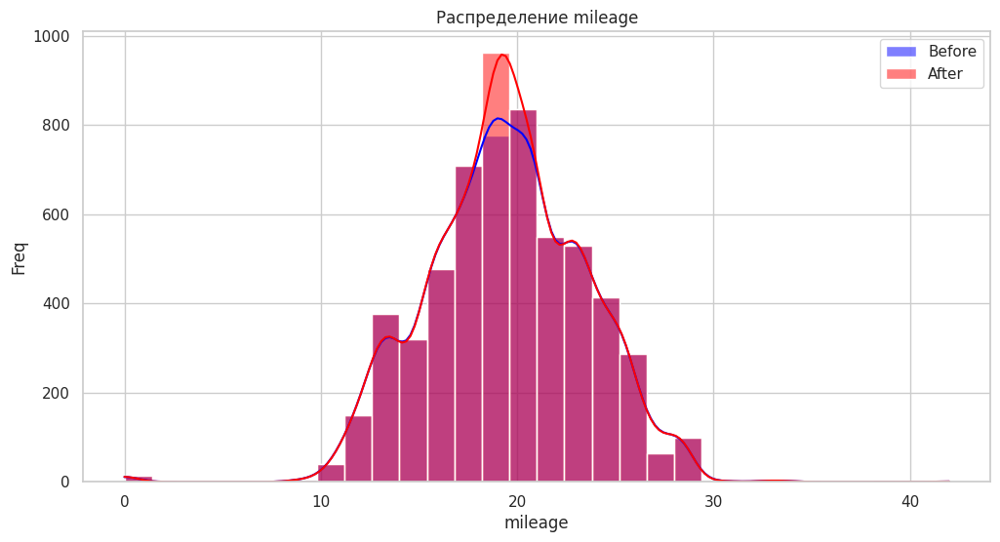

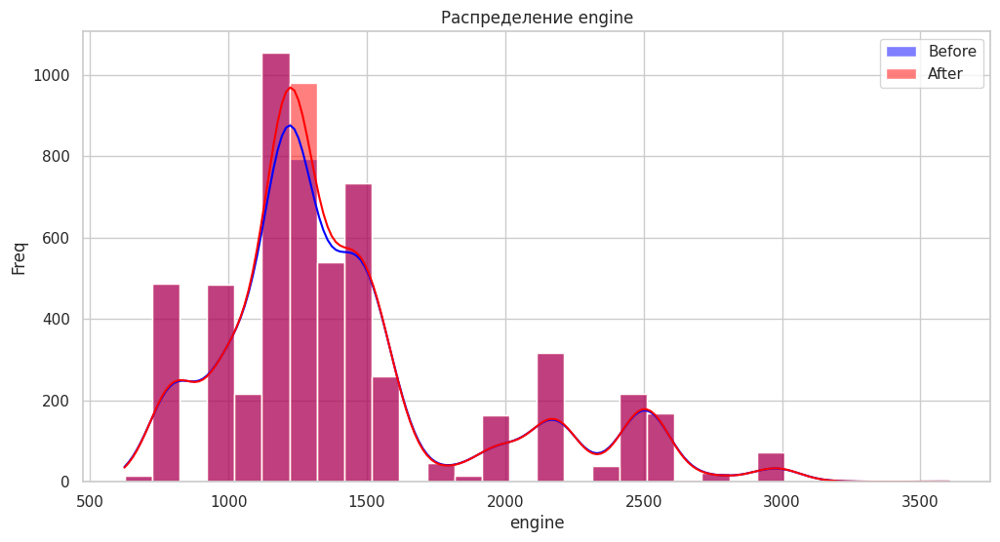

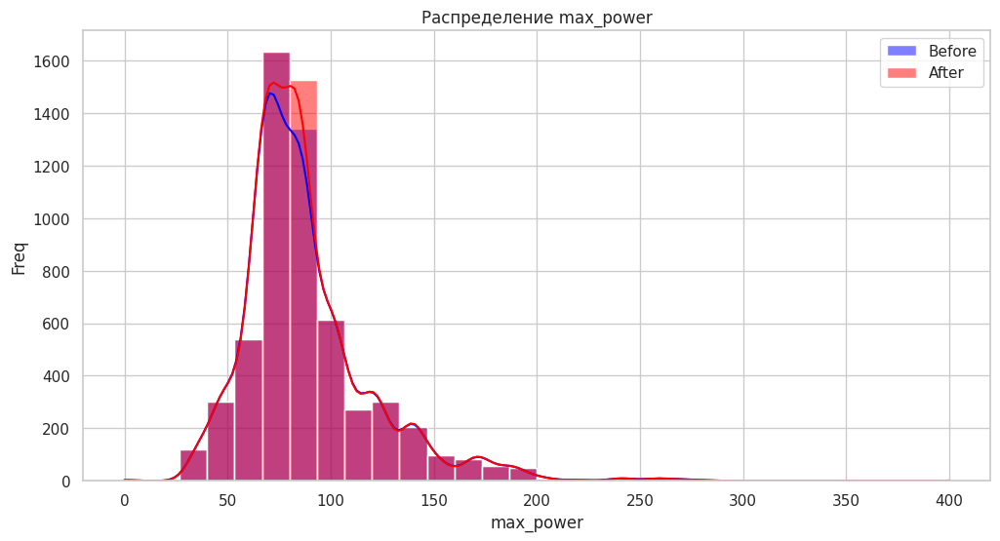

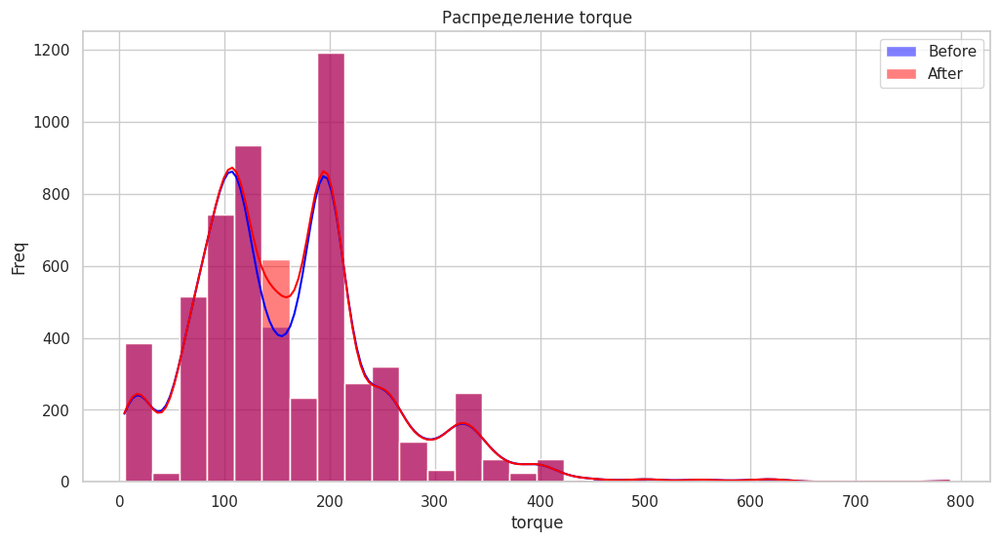

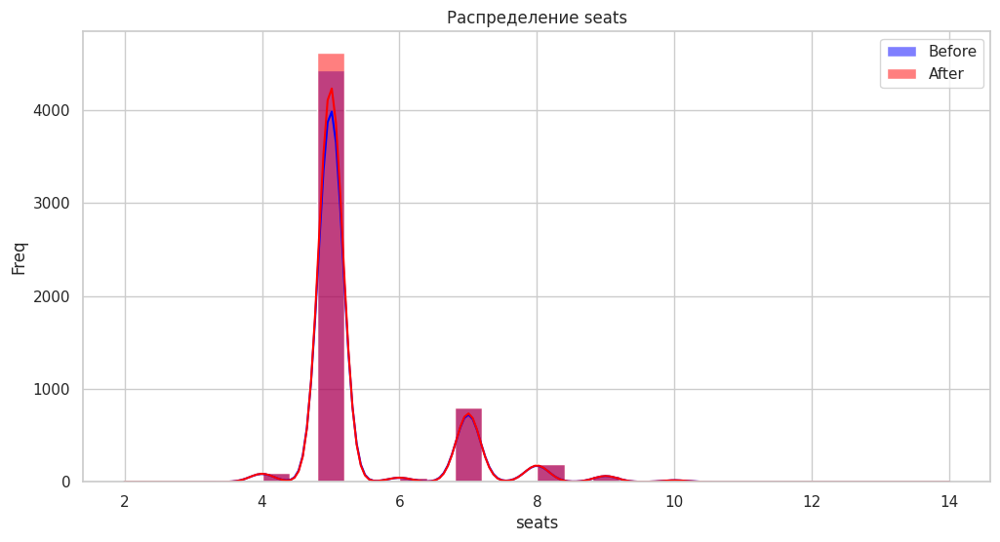

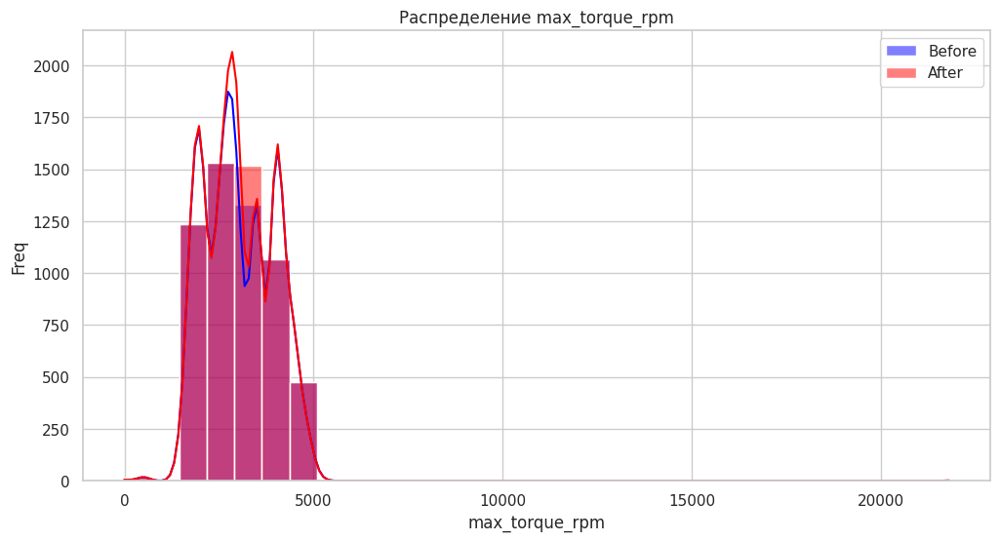

In [ ]:
features = ['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']

for feature in features:
    plt.figure(figsize=(12, 6))
    sns.histplot(df_train_before[feature], kde=True, color='blue', label='Before', bins=30)
    sns.histplot(df_train[feature], kde=True, color='red', label='After', bins=30)
    plt.title(f'Распределение {feature}')
    plt.xlabel(feature)
    plt.ylabel('Freq')
    plt.legend()

    plt.show()

> Можем заметить, что уменьшилось только стандарное отклонение. Стандартное отклонение отражает разброс данных относительно среднего значения. Если оно уменьшилось, это указывает на то, что данные стали более однородными. Заполнение пропусков фиксированными значениями (в данном случае медианами) может привести к уменьшению разброса, так как все заполненные значения становятся одинаковыми, что снижает вариативность в наборе данных.

> Ну и вобще, вроде как, распределенные по заполненным признакам осталось таким же как и было.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

<Figure size 1200x800 with 0 Axes>

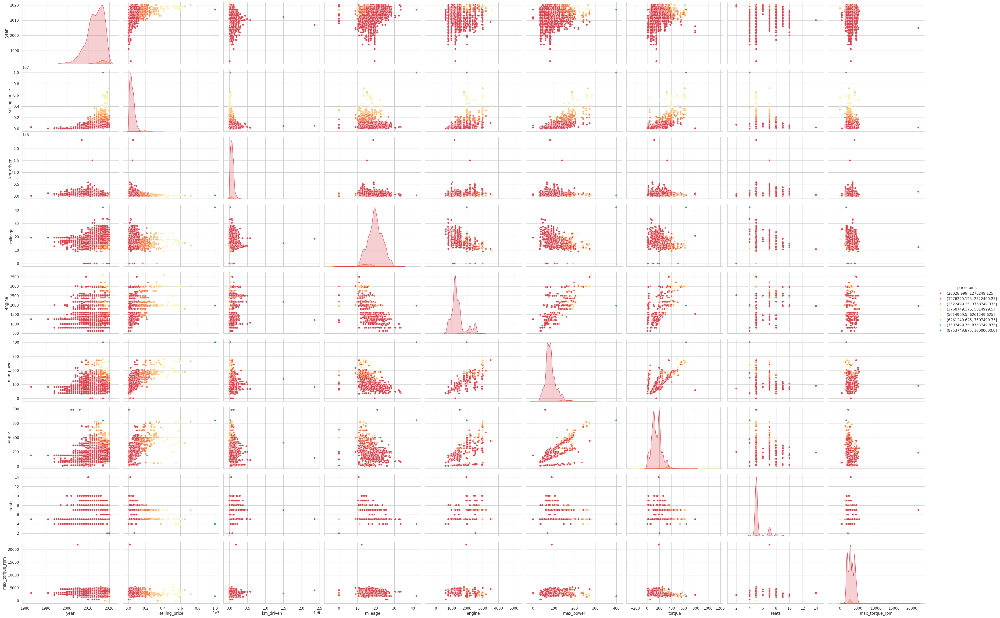

In [ ]:
df  = df_train.copy()
df['price_bins'] = pd.cut(df['selling_price'], bins=8)

plt.figure(figsize=(12, 8))
sns.pairplot(df, hue='price_bins', palette=sns.color_palette("Spectral", n_colors=len(df['price_bins'].unique())+1), height=3, aspect=1.5)

plt.show()

<Figure size 1200x800 with 0 Axes>

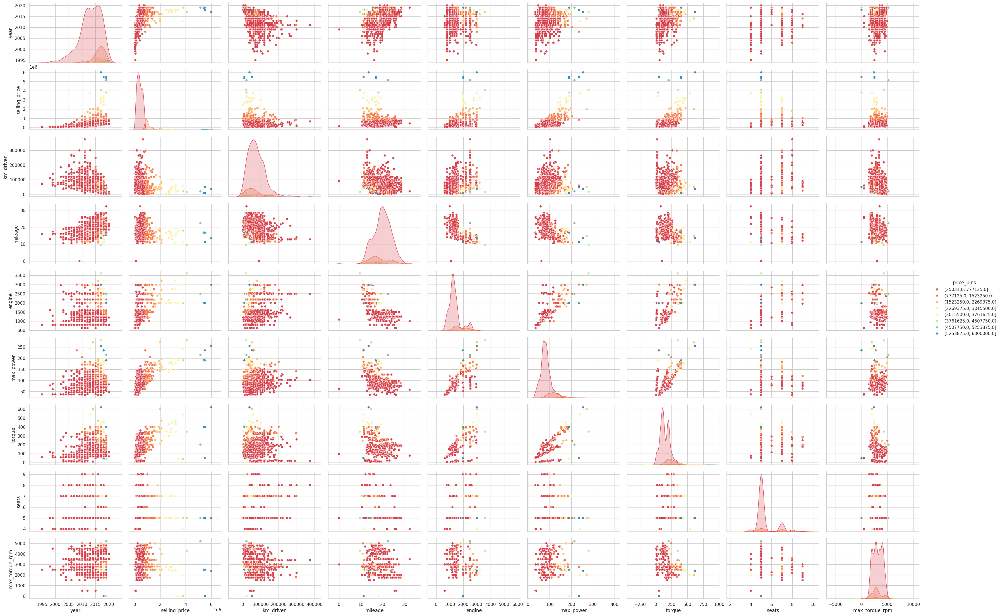

In [ ]:
df  = df_test.copy()
df['price_bins'] = pd.cut(df['selling_price'], bins=8)

plt.figure(figsize=(12, 8))
sns.pairplot(df, hue='price_bins', palette=sns.color_palette("Spectral", n_colors=len(df['price_bins'].unique())), aspect=1.5)

plt.show()

Вроде как похожи.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

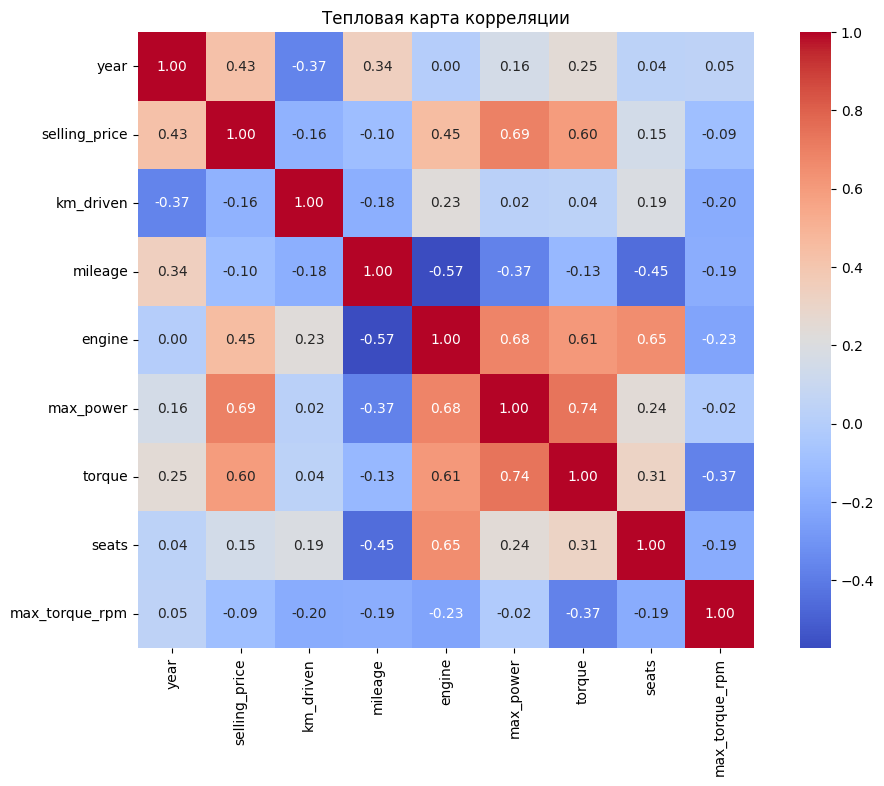

In [ ]:
corr_matrix = df_train.select_dtypes(include=[np.number]).corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Тепловая карта корреляции')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

> **Наименее скоррелированные признаки**
year и engine (0.002819). Это указывает на то, что между годом выпуска автомобиля и его объемом двигателя практически нет линейной зависимости.

> **Сильная положительная линейная зависимость**
max_power и torque (0.739074). Это говорит о том, что с увеличением мощности двигателя, как правило, увеличивается и крутящий момент.

> Существует отрицательная корреляция между year и km_driven (-0.368966). Это указывает на то, что с уменьшением года выпуска автомобиля, скорее всего, увеличивается пробег. Таким образом, можно утверждать, что чем меньше год, тем больше километров, проехала машина к дате продажи. Однако не всегда так мжно утверждать, необходимы дополнительные данные.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [ ]:
def spearman_rank_corr(x, y):
    n = len(x)
    ranks_x = np.argsort(np.argsort(x))
    ranks_y = np.argsort(np.argsort(y))
    di = ranks_x - ranks_y
    rho = 1 - (6 * np.sum(di**2)) / (n * (n**2 - 1))
    return rho

In [ ]:
def spearman_corr_matrix(df):
    num_cols = df.select_dtypes(include=[np.number]).columns
    corr_matrix = pd.DataFrame(index=num_cols, columns=num_cols)

    for i in num_cols:
        for j in num_cols:
            corr_matrix.loc[i, j] = spearman_rank_corr(df[i], df[j])

    return corr_matrix.astype(float)

In [ ]:
def spearman_corr_matrix_scipy(df):
    num_cols = df.select_dtypes(include=[np.number]).columns
    corr_matrix = pd.DataFrame(index=num_cols, columns=num_cols)

    for i in num_cols:
        for j in num_cols:
            corr_matrix.loc[i, j] = spearmanr(df[i], df[j])[0]

    return corr_matrix.astype(float)

In [ ]:
!pip install phik

In [ ]:
import phik

def phik_corr_matrix(df):
    return phik.phik_matrix(df)

In [ ]:
corr_matrix_spearman = spearman_corr_matrix(df_train)
corr_matrix_spearman_scipy = spearman_corr_matrix_scipy(df_train)
phik_matrix = phik_corr_matrix(df_train)

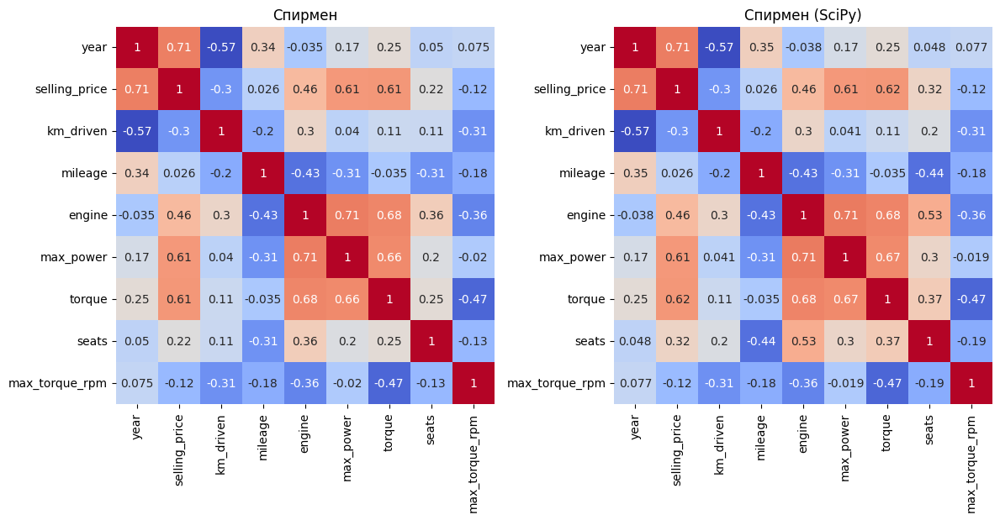

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

sns.heatmap(corr_matrix_spearman, annot=True, cmap='coolwarm', square=True, ax=axs[0], cbar=False)
axs[0].set_title("Спирмен")

sns.heatmap(corr_matrix_spearman_scipy, annot=True, cmap='coolwarm', square=True, ax=axs[1], cbar=False)
axs[1].set_title("Спирмен (SciPy)")

plt.tight_layout()
plt.show()

> Сравнивая матрицы корреляций Пирсона и Спирмена, можно отметить несколько ключевых моментов:
- В обеих матрицах наблюдается высокая положительная корреляция между годом и ценой, что подтверждает, что более новые автомобили имеют тенденцию к более высокой цене.
- В матрице Пирсона корреляция между пробегом и ценой составляет -0.1, а в матрице Спирмена 0.026. Это указывает на то, что в случае Спирмена связь менее выражена, возможно, из-за наличия выбросов или нелинейных зависимостей.
- В обеих матрицах наблюдается положительная корреляция между пробегом и ценой, что подтверждает, что более мощные автомобили стоят дороже.

> Есть еще отличия. однако, в целом, матрица Спирмена может быть более устойчивой к выбросам и лучше отражать монотонные зависимости, в то время как матрица Пирсона более чувствительна к линейным зависимостям.

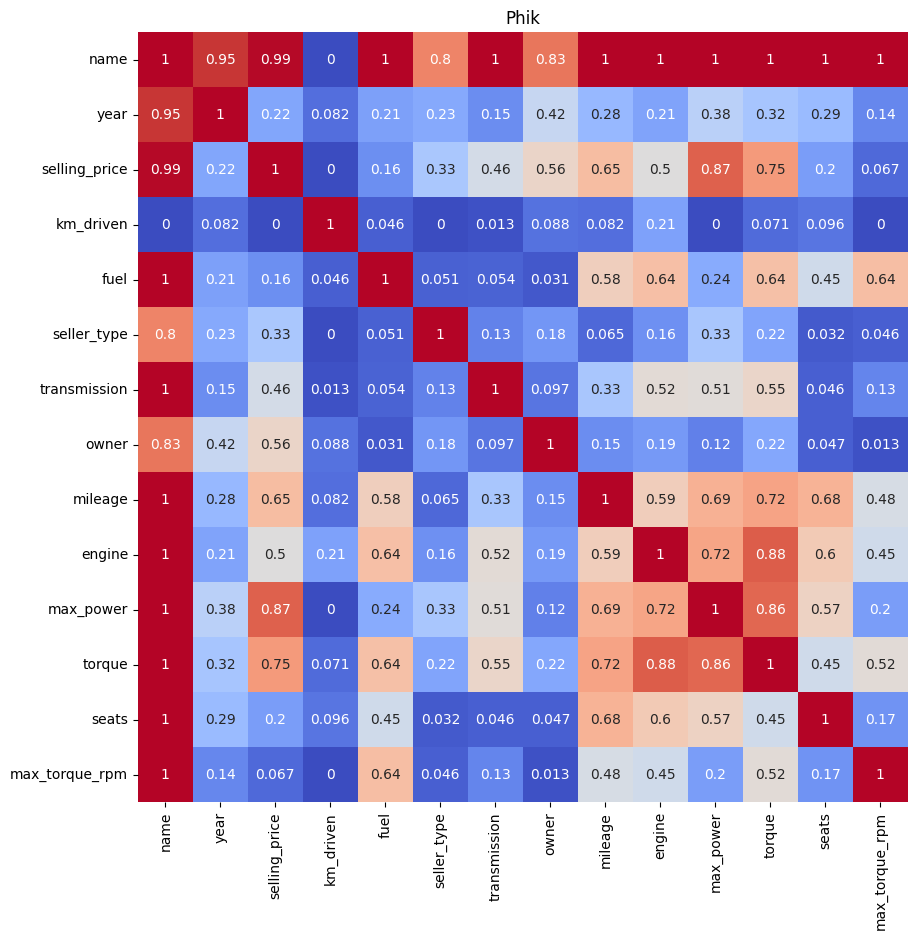

In [ ]:
plt.figure(figsize=(10, 10))
sns.heatmap(phik_matrix, annot=True, cmap='coolwarm', square=True, cbar=False)
plt.title("Phik")
plt.show()

> Матрица корреляций phik предоставляет информацию о взаимосвязях между переменными, учитывая как линейные, так и нелинейные зависимости.
- Положительная корреляция между year и selling_price показывает, что год выпуска автомобиля имеет умеренную связь с его ценой, что может указывать на то, что более новые автомобили стоят дороже, но эта связь не так сильна, как в двух предыдущих матрицах.
- Корреляция km_driven с selling_price равна 0, что может указывать на то, что пробег не имеет значительного влияния на цену в этом наборе данных, хотя в предыдущих матрицах была слабая отрицательная корреляция. Это может быть связано с тем, что другие факторы, такие как марка и модель, могут играть более важную роль.
- Сильная положительная корреляции между max_power и selling_price и между torque и selling_price показывают, что мощность и крутящий момент имеют значительное влияние на цену продажи, что ожидаемо, так как более мощные автомобили часто стоят дороже.
- Корреляции с fuel и seller_type относительно низкие, что может указывать на то, что эти переменные не оказывают значительного влияния на цену продажи.

> В целом, phik_matrix позволяет выявить сложные взаимосвязи между переменными и помогает понять, какие факторы могут оказывать наибольшее влияние на цену продажи автомобилей. Высокие значения корреляции указывают на важные зависимости, которые могут быть полезны при построении моделей прогнозирования или при анализе рынка.

### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

In [ ]:
df = df_train.copy()

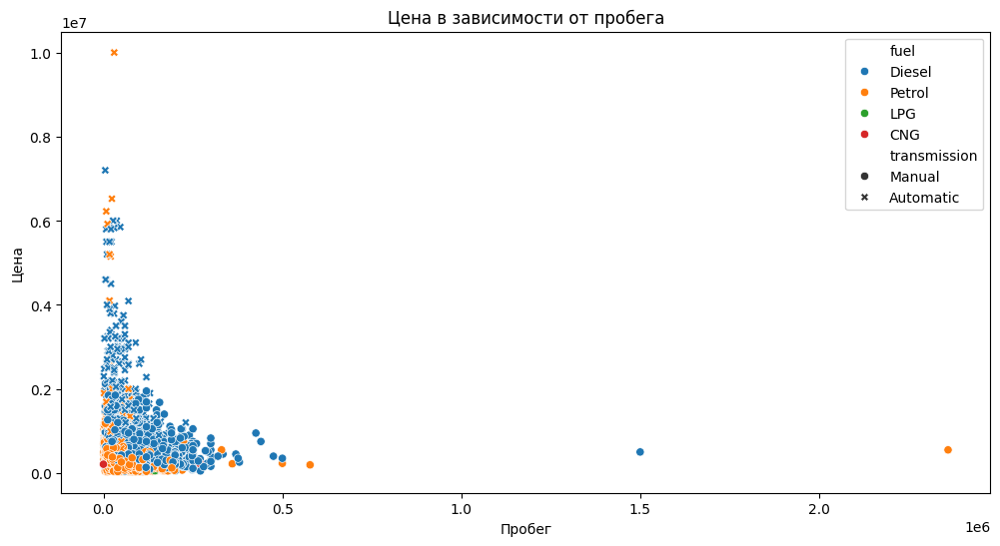

In [ ]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_train, x='km_driven', y='selling_price', hue='fuel', style='transmission')
plt.title('Цена в зависимости от пробега')
plt.xlabel('Пробег')
plt.ylabel('Цена')
plt.show()

> Тут мы можем заметить, что автомат стоит в среднем дороже механики и дизель в среднем дороже бензина. Также наблюдаются выбросы по пробегу и по цене.

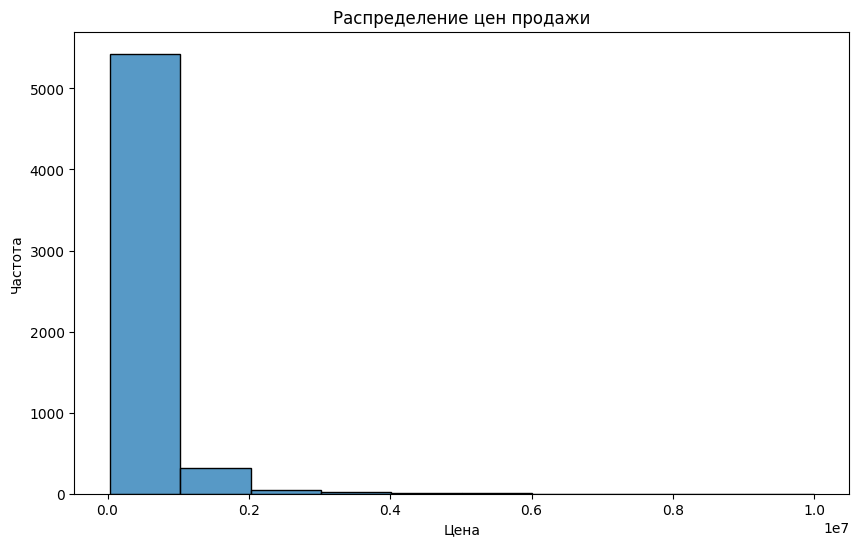

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df_train['selling_price'], bins=10)
plt.title('Распределение цен продажи')
plt.xlabel('Цена')
plt.ylabel('Частота')
plt.show()

> Заметим асимметричное распределение которое говорит о том, что большинство проданных машин (примерно 5500) продаются по цене менее 200000 уе. Также видно, что количество проданных машин, которые стоят дороже 200000 рублей, значительно уменьшается. Распределение цен неравномерное, с большим количеством машин, проданных по более низкой цене.

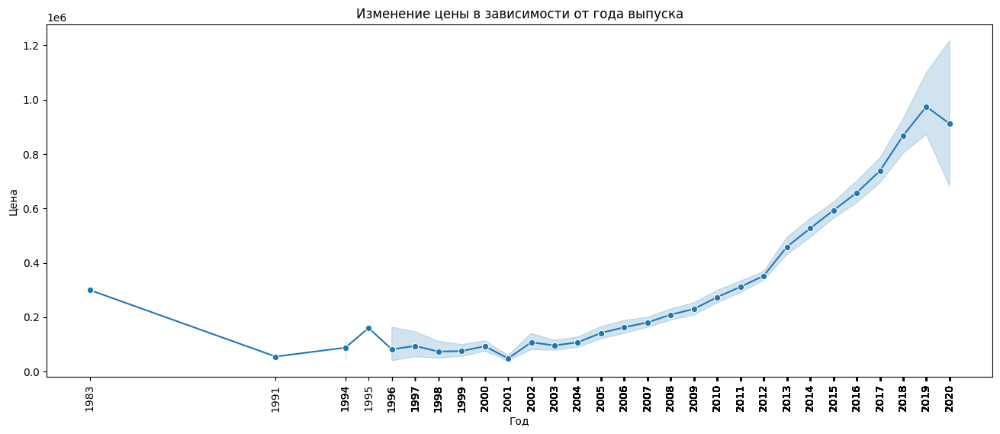

In [ ]:
plt.figure(figsize=(16, 6))
sns.lineplot(data=df_train, x='year', y='selling_price', marker='o')
plt.title('Изменение цены в зависимости от года выпуска')
plt.xlabel('Год')
plt.ylabel('Цена')
plt.xticks(df_train['year'], rotation=90)
plt.show()

> Заметим что, чем новее мошина, тем выше ее строимость, также можно заметить всплеск цены на винтажную машину 1983 года.

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [ ]:
X_train = df_train.drop(columns=['name', 'fuel', 'seller_type', 'transmission', 'owner', 'selling_price']).copy()
y_train = df_train['selling_price'].copy()

In [ ]:
assert X_train.shape == (5840, 8)

In [ ]:
X_test = df_test.drop(columns=['name', 'fuel', 'seller_type', 'transmission', 'owner', 'selling_price']).copy()
y_test = df_test['selling_price'].copy()

In [ ]:
assert X_test.shape == (1000, 8)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [ ]:
model = LinearRegression()
model.fit(X_train, y_train)

y_train_lr_pred = model.predict(X_train)
y_test_lr_pred = model.predict(X_test)

In [ ]:
train_rmse_lr = mean_squared_error(y_train, y_train_lr_pred)**0.5
test_rmse_lr = mean_squared_error(y_test, y_test_lr_pred)**0.5
train_r2_lr = r2_score(y_train, y_train_lr_pred)
test_r2_lr = r2_score(y_test, y_test_lr_pred)

In [ ]:
print(f"Train RMSE: {train_rmse_lr:.4f}")
print(f"Test RMSE: {test_rmse_lr:.4f}")
print(f"Train R2: {train_r2_lr:.4f}")
print(f"Test R2: {test_r2_lr:.4f}")

Train RMSE: 337243.1077
Test RMSE: 476756.4988
Train R²: 0.6032
Test R²: 0.6046


> Модель показывает нормальные результаты, объясняя около 60% вариации целевой переменной. Хотя разница в MSE указывает на возможное переобучение, близкие значения R2 на трейне и тесте говорят о том, что модель не слишком сильно переобучается.

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [ ]:
def calc_r2(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    # Среднее значение фактических данных
    y_mean = np.mean(y_true)
    # Сумма квадратов остатков
    SS_res = np.sum((y_true - y_pred) ** 2)
    # Общая сумму квадратов
    SS_tot = np.sum((y_true - y_mean) ** 2)
    # Вычисляем R2
    R2 = 1 - (SS_res / SS_tot)

    return R2

In [ ]:
my_train_r2 = calc_r2(y_train, y_train_lr_pred)
my_test_r2 = calc_r2(y_test, y_test_lr_pred)

In [ ]:
print(f"Train R2: {my_train_r2:.4f}")
print(f"Test R2: {my_test_r2:.4f}")

Train R2: 0.6032
Test R2: 0.6046


> **Объяснение функции:**
- Параметры:
  - y_true: фактические значения целевой переменной (можно передать в виде списка или массива).
  - y_pred: предсказанные значения модели (также можно передать в виде списка или массива).
- Возвращаемое значение: R2  как число с плавающей запятой.

> **Формула R2**
- R2 = 1 - SS_res/SS_tot, где
  - SS_res - Сумма квадратов остатков
  - SS_tot - Общая сумму квадратов

> Сумма квадратов остатков **SS_res** - это мера того, насколько хорошо модель предсказывает фактические значения. Рассчитывается как сумма квадратов разностей между фактическими значениями и предсказанными значениями.

> Общая сумма квадратов **SS_tot** - это мера показывает, насколько сильно фактические значения отклоняются от их среднего. Рассчитывается как сумма квадратов разностей между фактическими значениями и их средним.

> Чем меньше SS_res, тем лучше модель предсказывает данные.


### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [ ]:
def calc_adj_r2(X, y):
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    r2 = model.rsquared
    adj_r2 = model.rsquared_adj
    return r2, adj_r2

In [ ]:
X = np.random.rand(100, 3)  # 100 наблюдений и 3 предиктора
y = np.random.rand(100)      # Зависимая переменная

r2, adj_r2 = calc_adj_r2(X, y)

In [ ]:
print(f"R2: {r2}")
print(f"Adjusted - R2: {adj_r2}")

R2: 0.04135486324750204
Adjusted - R2: 0.011397202723986477


 > **adjusted - R2** применяется, когда:
- Помогает при добавлении новых независимых переменных в модель, так как он может уменьшаться, если новые переменные не улучшают модель.
- Используется для сравнения различных моделей регрессии, особенно когда модели имеют разное количество признаков. Он позволяет определить, какая модель лучше объясняет вариацию зависимой переменной с учетом количества признаков.
- Чтобы избежать переобучения модели, так как он штрафует за добавление лишних признаков, которые не вносят значимого вклада.

> adjusted - R2 = 1 - ((1 - R2)(1 - n)/(n - k - 1)), где
- R2 - коэффициент детерминации,
- n - общее количество наблюдений,
- k - количество признаков в модели.



### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [ ]:
scaler = StandardScaler()

X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)

In [ ]:
model_sc = LinearRegression()
model_sc.fit(X_train_sc, y_train)

LinearRegression()

In [ ]:
y_train_sc_pred = model_sc.predict(X_train_sc)
y_test_sc_pred = model_sc.predict(X_test_sc)

In [ ]:
train_rmse_sc = mean_squared_error(y_train, y_train_sc_pred)**0.5
test_rmse_sc = mean_squared_error(y_test, y_test_sc_pred)**0.5
train_r2_sc = r2_score(y_train, y_train_sc_pred)
test_r2_sc = r2_score(y_test, y_test_sc_pred)

In [ ]:
print(f"Train RMSE: {train_rmse_sc:.4f}")
print(f"Test RMSE: {test_rmse_sc:.4f}")
print(f"Train R2: {train_r2_sc:.4f}")
print(f"Test R2: {test_r2_sc:.4f}")

Train RMSE: 337243.1077
Test RMSE: 476756.4988
Train R2: 0.6032
Test R2: 0.6046


In [ ]:
print("DIFF")
print(f"Train RMSE: {train_rmse_lr - train_rmse_sc}")
print(f"Test RMSE: {test_rmse_lr - test_rmse_sc}")
print(f"Train R2: {train_r2_lr - train_r2_sc}")
print(f"Test R2: {test_r2_lr - test_r2_sc}")

DIFF
Train RMSE: 0.0
Test RMSE: 6.402842700481415e-10
Train R2: 0.0
Test R2: -1.1102230246251565e-15


> - RMSE уeменьшился на 6.402842700481415e-10, что может указывать на небольшое улучшение модели.
- R2 увеличился на -1.1102230246251565e-15, что фактически является незначительным изменением и может указывать на то, что модель не ухудшилась, но и не улучшилась существенно.
Выводы

> Скалирование данных совсем немного помогло улучшить модель.

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [ ]:
coef = model_sc.coef_
coef

array([164051.94843512, -48851.2199497 , -13214.37033915,  18792.6139354 ,
       320617.6864748 ,  20023.5442707 , -31369.66813316, -59439.85004141])

In [ ]:
max_abs = np.argmax(np.abs(coef))

print(f"Наиболее информативный признак: {X_train.columns[max_abs]} \n"
      f"Коэффициент: {coef[max_abs]}")

Наиболее информативный признак: max_power 
Коэффициент: 320617.68647479976


### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [ ]:
lasso = Lasso()
lasso.fit(X_train_sc, y_train)

Lasso()

In [ ]:
y_train_lss_pred = lasso.predict(X_train_sc)
y_test_lss_pred = lasso.predict(X_test_sc)

In [ ]:
train_rmse_lss = mean_squared_error(y_train, y_train_lss_pred)**0.5
test_rmse_lss = mean_squared_error(y_test, y_test_lss_pred)**0.5
train_r2_lss = r2_score(y_train, y_train_lss_pred)
test_r2_lss = r2_score(y_test, y_test_lss_pred)

In [ ]:
print(f"Train MSE: {train_rmse_lss:.4f}")
print(f"Test MSE: {test_rmse_lss:.4f}")
print(f"Train R²: {train_r2_lss:.4f}")
print(f"Test R²: {test_r2_lss:.4f}")

Train MSE: 337243.1077
Test MSE: 476757.3951
Train R²: 0.6032
Test R²: 0.6046


In [ ]:
print("DIFF")
print(f"Train RMSE: {train_rmse_sc - train_rmse_lss}")
print(f"Test RMSE: {test_rmse_sc - test_rmse_lss}")
print(f"Train R²: {train_r2_sc - train_r2_lss}")
print(f"Test R²: {test_r2_sc - test_r2_lss}")

DIFF
Train RMSE: -2.036977093666792e-05
Test RMSE: -0.8963240594021045
Train R²: 4.7932102731351733e-11
Test R²: 1.4868040839610686e-06


Можем заметить, что модель снова незначительно улучилась.

In [ ]:
for l, m, i in zip(lasso.coef_, model_sc.coef_, range(9)):
    print(f"{X_train.columns[i]} -->", abs(l) - abs(m))

year --> -2.284847506613005
km_driven --> -0.8964593204800622
mileage --> -3.397915001234651
engine --> -1.9308995014434913
max_power --> 0.8679758620564826
torque --> 0.17343681587226456
seats --> -3.900937970400264
max_torque_rpm --> -2.3106200688926037


Можем заметить, что все признаки кроме torque и max_power лассо уменьшило (приблизо к 0). Заметим еще также, что лассо увеличило признаки torque и max_power, в прошлом эксперементе мы убелились, что max_power важный признак и он увеличился больше всего.

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [ ]:
lasso = Lasso()

In [ ]:
# эмпирическим путем был выбран такой большой диапазон :)
param_grid = {
    'alpha': [float(i) for i in range(100, 25001, 100)]
}

In [ ]:
grid_search = GridSearchCV(lasso, param_grid, cv=10)
grid_search.fit(X_train_sc, y_train)

GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': [100.0, 200.0, 300.0, 400.0, 500.0, 600.0,
                                   700.0, 800.0, 900.0, 1000.0, 1100.0, 1200.0,
                                   1300.0, 1400.0, 1500.0, 1600.0, 1700.0,
                                   1800.0, 1900.0, 2000.0, 2100.0, 2200.0,
                                   2300.0, 2400.0, 2500.0, 2600.0, 2700.0,
                                   2800.0, 2900.0, 3000.0, ...]})

In [ ]:
best_alpha = grid_search.best_params_['alpha']
best_model = grid_search.best_estimator_
non_zero_coefficients = np.sum(best_model.coef_ != 0)
zero_coefficients = np.sum(best_model.coef_ == 0)

In [ ]:
print(f"Лучший коэффициент регуляризации (alpha): {best_alpha}")
print(f"Количество ненулевых коэффициентов: {non_zero_coefficients}")
print(f"Количество зануленных коэффициентов: {zero_coefficients}")

Лучший коэффициент регуляризации (alpha): 21900.0
Количество ненулевых коэффициентов: 5
Количество зануленных коэффициентов: 3


> Количество моделей, которые обучает GridSearchCV, рассчитывается как произведение количества параметров в сетке на количество фолдов в кросс-валидации. В данном случае:
- Количество значений для alpha: 249
- Количество фолдов: 10
- **Общее количество моделей**: 249 * 10 = 2490

>
- 1 параметр (lasso) - модель для обучения
- 2 параметр (alpha) - коэффициент регуляризации. Он контролирует степень штрафа за сложность модели. Чем выше значение alpha, тем сильнее регуляризация, что может привести к занулению некоторых коэффициентов.
- 3 параметр (cv) - количество подмножеств (фолдов), на которые данные делятся. Модель обучается на 9 из 10 фолдов и тестируется на оставшемся 1 фолде. Этот процесс повторяется 10 раз, каждый раз выбирая другой фолд в качестве тестового, а остальные 9 в качестве обучающих.


**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [ ]:
elastic_net = ElasticNet()

In [ ]:
param_grid = {
    'alpha': [0.01, 0.1, 0.5, 1, 10],
    'l1_ratio': [0.1, 0.5, 0.9, 0.95, 1.0]
}

In [ ]:
grid_search = GridSearchCV(elastic_net, param_grid, cv=10)
grid_search.fit(X_train_sc, y_train)

GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': [0.01, 0.02, 0.1, 0.5, 1, 10],
                         'l1_ratio': [0.1, 0.5, 0.9, 0.95, 1.0]})

In [ ]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_
non_zero_coefficients = np.sum(best_model.coef_ != 0)
zero_coefficients = np.sum(best_model.coef_ == 0)

In [ ]:
print(f"Лучшие гиперпараметры: {best_params}")
print(f"Количество ненулевых коэффициентов: {non_zero_coefficients}")
print(f"Количество зануленных коэффициентов: {zero_coefficients}")

Лучшие гиперпараметры: {'alpha': 1, 'l1_ratio': 0.9}
Количество ненулевых коэффициентов: 8
Количество зануленных коэффициентов: 0


> Количество моделей, которые обучает GridSearchCV, рассчитывается как произведение количества параметров в сетке на количество фолдов в кросс-валидации. В данном случае:
- Количество значений для alpha: 5
- Количество значений для l1_ratio: 5
- Количество фолдов: 10
- **Общее количество моделей**: 5 * 5 * 10 = 250

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [ ]:
# Функция потерь с L0-регуляризацией
def loss_function(coef, X, y, lambda_l0):
    predictions = X @ coef
    l0_penalty = np.sum(coef != 0)
    mse = np.mean((predictions - y) ** 2)
    return mse + lambda_l0 * l0_penalty

In [ ]:
# Функция для обучения модели с L0-регуляризацией
def fit_l0(X, y, lambda_l0):
    initial_coef = np.zeros(X.shape[1])
    result = minimize(loss_function, initial_coef, args=(X, y, lambda_l0), method='L-BFGS-B')
    return result.x

In [ ]:
lambda_values = [0.1, 0.8, 0.9, 1]

for lambda_l0 in lambda_values:
    coef = fit_l0(X_train_sc, y_train, lambda_l0)
    predictions = X_test_sc @ coef
    rmse = np.mean((predictions - y_test) ** 2)**0.5
    r2 = r2_score(y_test, predictions)
    print(f"lambda: {lambda_l0}, RMSE: {rmse:.4f}, R2: {r2:.4f}, Ненулевые коэффициенты: {np.sum(coef != 0)}")

lambda: 0.1, RMSE: 978074.7688, R2: -0.6642, Ненулевые коэффициенты: 0
lambda: 0.8, RMSE: 978074.7688, R2: -0.6642, Ненулевые коэффициенты: 0
lambda: 0.9, RMSE: 978074.7688, R2: -0.6642, Ненулевые коэффициенты: 0
lambda: 1, RMSE: 978074.7688, R2: -0.6642, Ненулевые коэффициенты: 0


> Хотя L0-регуляризация обладает интересными свойствами и может быть полезной в определенных случаях, ее сложность в оптимизации делает ее менее распространенной по сравнению с L1 и L2 регуляризациями.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [ ]:
def name_to_brand(df, threshold):
    df['brand'] = df['name'].apply(lambda x: x.split(' ')[0])
    value_counts = df['brand'].value_counts()
    df['brand'] = df['brand'].apply(lambda x: x if value_counts[x] >= threshold else 'Other')
    df = df.drop(columns=['name'])

    return df

In [ ]:
class NameToBrandTransformer:
    def __init__(self, threshold):
        self.threshold = threshold
        self.value_counts_ = None
        self.unique_brands_ = set()

    def fit(self, df):
        self.value_counts_ = df['name'].apply(lambda x: x.split(' ')[0]).value_counts()
        self.unique_brands_ = set(self.value_counts_.index)
        return self

    def transform(self, df):
        df['brand'] = df['name'].apply(lambda x: x.split(' ')[0])
        df['brand'] = df['brand'].apply(lambda x: x if (x in self.unique_brands_ and self.value_counts_.get(x, 0) >= self.threshold) else 'Other')
        df = df.drop(columns=['name'])
        return df

    def fit_transform(self, df):
        return self.fit(df).transform(df)

In [ ]:
thresholds = range(0, 61, 1)
results = []

for threshold in thresholds:
    df = edf_train.drop(columns=['fuel', 'seller_type', 'transmission', 'owner']).copy()

    df = name_to_brand(df, threshold)
    df = pd.get_dummies(df, columns=['brand'], drop_first=True)

    y = df['selling_price'].copy()
    X = df.drop(columns=['selling_price'])
    Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2, random_state=42)

    model = LinearRegression()
    model.fit(Xtrain, ytrain)

    ypred = model.predict(Xtest)

    rmse = np.sqrt(mean_squared_error(ytest, ypred))
    r2 = r2_score(ytest, ypred)

    results.append({'threshold': threshold, 'RMSE': rmse, 'R2': r2})

results_df = pd.DataFrame(results)

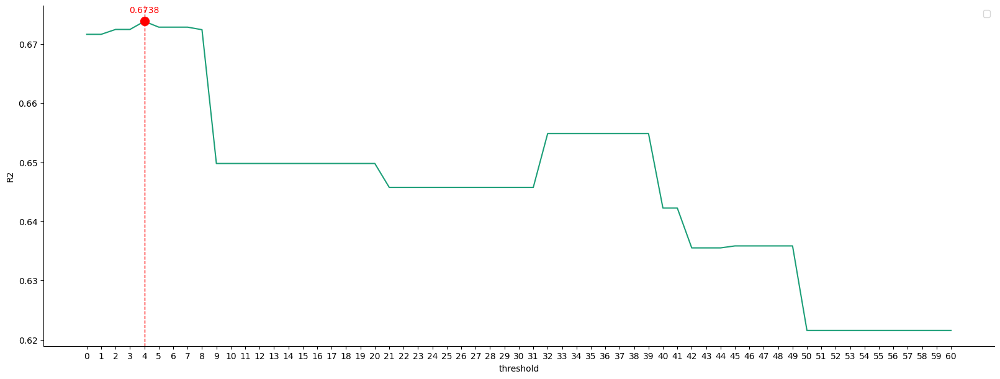

In [ ]:
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['threshold']
    ys = series['R2']

    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(16, 6), layout='constrained')
df_sorted = results_df.sort_values('threshold', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)

plt.xlabel('threshold')
_ = plt.ylabel('R2')

plt.xticks(df_sorted['threshold'].unique())

max_row = df_sorted.nlargest(1, 'R2').iloc[0]
plt.scatter(max_row['threshold'], max_row['R2'], color='red', s=100, zorder=5)
plt.annotate(f'{max_row["R2"]:.4f}', (max_row['threshold'], max_row['R2']), textcoords="offset points", xytext=(0,10), ha='center', color='red')
plt.axvline(x=max_row['threshold'], color='red', linestyle='--', linewidth=1)

plt.legend()
plt.show()

In [ ]:
cdf_train = name_to_brand(edf_train, 4)
cdf_test = name_to_brand(edf_test, 4)

In [ ]:
transformer = NameToBrandTransformer(threshold=0)

cdf_train = transformer.fit_transform(edf_train)
cdf_test = transformer.transform(edf_test)

In [ ]:
assert cdf_train.shape == (5840, 14)

In [ ]:
cdf_train.describe(include='object')

,fuel,seller_type,transmission,owner,brand
count,5840,5840,5840,5840,5840
unique,4,3,2,5,30
top,Diesel,Individual,Manual,First Owner,Maruti
freq,3177,5223,5336,3603,1804


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [ ]:
cat_cols = list(cdf_train.select_dtypes(include=['object']).columns) + ['seats']

cat_cols

['fuel', 'seller_type', 'transmission', 'owner', 'brand', 'seats']

In [ ]:
encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown="ignore")

In [ ]:
enc_feat = encoder.fit_transform(cdf_train[cat_cols])
enc_df = pd.DataFrame(enc_feat, columns=encoder.get_feature_names_out(cat_cols))
enc_train = pd.concat([cdf_train.drop(columns=cat_cols).reset_index(drop=True), enc_df.reset_index(drop=True)], axis=1)

In [ ]:
enc_feat = encoder.transform(cdf_test[cat_cols])
enc_df = pd.DataFrame(enc_feat, columns=encoder.get_feature_names_out(cat_cols))
enc_test = pd.concat([cdf_test.drop(columns=cat_cols).reset_index(drop=True), enc_df.reset_index(drop=True)], axis=1)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:242: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [ ]:
enc_test.columns

Index(['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power',
       'torque', 'max_torque_rpm', 'fuel_Diesel', 'fuel_LPG', 'fuel_Petrol',
       'seller_type_Individual', 'seller_type_Trustmark Dealer',
       'transmission_Manual', 'owner_Fourth & Above Owner',
       'owner_Second Owner', 'owner_Test Drive Car', 'owner_Third Owner',
       'brand_Audi', 'brand_BMW', 'brand_Chevrolet', 'brand_Daewoo',
       'brand_Datsun', 'brand_Fiat', 'brand_Force', 'brand_Ford',
       'brand_Honda', 'brand_Hyundai', 'brand_Isuzu', 'brand_Jaguar',
       'brand_Jeep', 'brand_Kia', 'brand_Land', 'brand_Lexus', 'brand_MG',
       'brand_Mahindra', 'brand_Maruti', 'brand_Mercedes-Benz',
       'brand_Mitsubishi', 'brand_Nissan', 'brand_Peugeot', 'brand_Renault',
       'brand_Skoda', 'brand_Tata', 'brand_Toyota', 'brand_Volkswagen',
       'brand_Volvo', 'seats_4', 'seats_5', 'seats_6', 'seats_7', 'seats_8',
       'seats_9', 'seats_10', 'seats_14'],
      dtype='object')

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

> **Корректная работа с OHE:**
- OHE стоит применять только к категориальным признакам, в противном случае это может привести к потере информации
- Перед OHE необходимо разделить данные на обучающую и тестовую выборки, это важно, чтобы избежать утечки информации из теста выборки в трейн
- Надо использовать трансформер OHE для обеих выборок (трейна и теста), чтобы гарантировать, что они имеют одинаковое количество и порядок признаков
- Удаление одного столбца: При использовании OHE часто удаляют один из полученных столбцов (обычно первый или последний), это необходимо потому, что все столбцы OHE в сумме дают информацию о категории, и наличие всех столбцов приведет к линейной зависимости

> Удаление одного столбца из закодированных категорий связано с проблемой мультиколлинеарности. Мультиколлинеарность возникает, когда один или несколько признаков могут быть выражены через другие признаки, что может затруднить интерпретацию модели и привести к нестабильным коэффициентам.

> Мне кажется не совсем корректно удалять закодированные столбцы, ведь могут взникнуть проблемы с интерпретацией оставшихся признаков от этого признака (n - 1) - k

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [ ]:
y_train = enc_train['selling_price']
X_train_enc = enc_train.drop(columns=['selling_price'])

y_test = enc_test['selling_price']
X_test_enc = enc_test.drop(columns=['selling_price'])

In [ ]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train_enc)
X_test_scaled = scaler.transform(X_test_enc)

In [ ]:
from sklearn.linear_model import Ridge

ridge = Ridge(alpha=613.5907273413176)

In [ ]:
ridge.fit(X_train_scaled, y_train)

Ridge(alpha=613.5907273413176)

In [ ]:
param_grid = {'alpha': np.logspace(-4, 4, 100)}
grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid, scoring='r2', cv=10)

In [ ]:
grid_search.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': array([1.00000000e-04, 1.20450354e-04, 1.45082878e-04, 1.74752840e-04,
       2.10490414e-04, 2.53536449e-04, 3.05385551e-04, 3.67837977e-04,
       4.43062146e-04, 5.33669923e-04, 6.42807312e-04, 7.74263683e-04,
       9.32603347e-04, 1.12332403e-03, 1.35304777e-03, 1.62975083e-03,
       1.96304065e-03, 2.36448941e-03, 2.84803587e-03, 3...
       1.38488637e+02, 1.66810054e+02, 2.00923300e+02, 2.42012826e+02,
       2.91505306e+02, 3.51119173e+02, 4.22924287e+02, 5.09413801e+02,
       6.13590727e+02, 7.39072203e+02, 8.90215085e+02, 1.07226722e+03,
       1.29154967e+03, 1.55567614e+03, 1.87381742e+03, 2.25701972e+03,
       2.71858824e+03, 3.27454916e+03, 3.94420606e+03, 4.75081016e+03,
       5.72236766e+03, 6.89261210e+03, 8.30217568e+03, 1.00000000e+04])},
             scoring='r2')

In [ ]:
best_ridge = grid_search.best_estimator_
y_pred = best_ridge.predict(X_test_scaled)
r2_score_test = r2_score(y_test, y_pred)

print("Лучший параметр alpha:", grid_search.best_params_)
print(f"Лучшее значение R2 на обучающей выборке: {grid_search.best_score_:.2f}")
print(f"R2 на тестовой выборке: {r2_score_test:.2f}")

Лучший параметр alpha: {'alpha': 613.5907273413176}
Лучшее значение R2 на обучающей выборке: 0.71
R2 на тестовой выборке: 0.78


In [ ]:
y_pred = best_ridge.predict(X_test_scaled)
r2_score_test = r2_score(y_test, y_pred)

print(f"R2 на тестовой выборке: {r2_score_test:.2f}")

R2 на тестовой выборке: 0.78


> Значения R2 на обеих выборках показывают, что модель верно предсказывает более 70% значений. Это почти на 10% больше, чем до этого. Еще R2 на тесте выше, чем на трейне, возможно потому, что модель не переобучена и имеет хорошую способность к обобщению


# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [ ]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.linear_model import Lasso
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import mean_squared_error, r2_score

class CombinedTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, threshold):
        self.threshold = threshold
        self.value_counts_ = None
        self.unique_brands_ = set()

    def fit(self, X, y=None):
        # заполнение пропусков медианой
        self.medians_ = X.select_dtypes(include=['float64', 'int64']).median()
        # подсчет брендов
        self.value_counts_ = X['name'].apply(lambda x: x.split(' ')[0]).value_counts()
        self.unique_brands_ = set(self.value_counts_.index)
        return self

    def transform(self, X):
        # преобразование категориальных данных
        for col in ["mileage", "engine", "max_power"]:
            X[col] = X[col].fillna('').str.extract('(\d+\.?\d*)').astype(float)

        X[['torque', 'max_torque_rpm']] = X['torque'].str.replace(',', '').str.extract(r'^([\d.,]+).*?([\d.,]+)(?=\D*$)').astype(float)

        # заполнение пропусков
        X[X.select_dtypes(include=['float64', 'int64']).columns] = X.select_dtypes(include=['float64', 'int64']).apply(lambda x: x.fillna(x.median()))

        # преобразование типов
        X['engine'] = X['engine'].astype(int)
        X['seats'] = X['seats'].astype(int)

        # извлечение марки
        X['brand'] = X['name'].apply(lambda x: x.split(' ')[0])
        X['brand'] = X['brand'].apply(lambda x: x if (x in self.unique_brands_ and self.value_counts_.get(x, 0) >= self.threshold) else 'Other')
        X = X.drop(columns=['name'])

        # создание новых признаков
        X['power_per_litre'] = X['max_power'] / X['engine']
        X['km_per_year'] = X['km_driven'] / (2024 - X['year'])
        X['is_first_owner'] = X['owner'].apply(lambda x: 1 if x == 'First Owner' else 0)
        X['is_test_drive_car'] = X['owner'].apply(lambda x: 1 if x == 'Test Drive Car' else 0)
        return X

    def fit_transform(self, X, y=None):
        self.fit(X, y)
        return self.transform(X)

# Обработка данных
train = df_train.copy()
test = df_test.copy()

# удаление дубликатов
train.drop_duplicates(subset=df_train.columns.drop('selling_price'), keep='first', inplace=True)
train.reset_index(drop=True, inplace=True)
test.drop_duplicates(subset=df_train.columns.drop('selling_price'), keep='first', inplace=True)
test.reset_index(drop=True, inplace=True)

# обучение и предсказание
y_train = train['selling_price']
X_train = train.drop(columns=['selling_price'])
y_test = test['selling_price']
X_test = test.drop(columns=['selling_price'])

# создание пайплайн
pipeline = Pipeline(steps=[
    ('combined_transformer', CombinedTransformer(threshold=10)),
    ('preprocessor', ColumnTransformer(
        transformers=[
            ('num', Pipeline(steps=[
                ('poly', PolynomialFeatures(degree=3, include_bias=False)),
                ('scaler', StandardScaler())
            ]), ['year', 'km_driven', 'seats', 'max_power', 'engine', 'mileage', 'max_torque_rpm', 'torque', 'km_per_year', 'power_per_litre']),
            ('cat', OneHotEncoder(drop='first'), ['brand', 'fuel', 'seller_type', 'transmission', 'owner', 'is_test_drive_car', 'is_first_owner'])
        ])),
    ('model', Lasso(alpha=100))
])

# обучение модели
pipeline.fit(X_train.copy(), y_train)

# Предсказания
y_train_pred = pipeline.predict(X_train.copy())
y_test_pred = pipeline.predict(X_test.copy())

# Оценка модели
train_rmse = mean_squared_error(y_train, y_train_pred)**0.5
test_rmse = mean_squared_error(y_test, y_test_pred)**0.5
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Train RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Train R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")

пу-пу-пу

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [ ]:
def business_metrics(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Вычисляем 10% от реальных цен
    margin = 0.1 * y_true

    # Проверяем, попадает ли предсказанная цена в диапазон
    within_margin = (y_pred >= (y_true - margin)) & (y_pred <= (y_true + margin))

    # Вычисляем долю предсказаний, попадающих в диапазон
    metric = np.sum(within_margin) / len(y_true)

    return metric

In [ ]:
print("Доля предсказаний в пределах 10%:", business_metrics(y_test, y_pred))

Доля предсказаний в пределах 10%: 0.32


### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [ ]:
def your_business_metrics(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    errors = np.where(y_pred < y_true, -(y_true - y_pred), (y_pred - y_true))
    metric = np.mean(errors)

    return metric

In [ ]:
print("Кастомная метрика:", your_business_metrics(y_test, y_pred))

Кастомная метрика: -21230.34523111407


> Для новой кастомной метрики, учитывающей, что недопрогноз (предсказанная цена ниже реальной) считается хуже, чем перепрогноз (предсказанная цена выше реальной)
- Если предсказанная цена меньше реальной, мы будем считать это более серьезной ошибкой и присваивать ей отрицательное значение
- Если предсказанная цена больше реальной, мы будем считать это менее серьезной ошибкой и присваивать ей положительное значение

> Формула для расчета метрики:
- Если y_pred < y_true, то ошибка будет -(y_true - y_pred)
- Если y_pred >= y_true, то ошибка будет (y_pred - y_true)
Итоговая метрика будет вычисляться как среднее значение ошибок

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

### app.py

In [ ]:
"""
Модуль для предсказания цен автомобилей с использованием FastAPI и модели машинного обучения.
"""
import nest_asyncio
nest_asyncio.apply()
import os
from io import StringIO
from typing import List

import joblib
import pandas as pd
import uvicorn
# from transformer import CombinedTransformer
from fastapi import FastAPI, UploadFile, File, HTTPException
from fastapi.responses import FileResponse
from pydantic import BaseModel


class Item(BaseModel):
    """Определение модели Item (представляет данные об автомобиле)"""

    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class ItemCollection(BaseModel):
    """Определение коллекции Item (коллекция автомобилей)"""

    items: List[Item]


class PredictionService:
    """Сервис предсказаний"""

    def __init__(self, model_path: str):
        """Загрузка модели"""
        self.pipeline = joblib.load(model_path)

    def predict_single(self, item: Item) -> float:
        """Предсказание цены для одного автомобиля"""
        item_data = item.dict()
        item_data.pop("selling_price", None)
        data = pd.DataFrame([item_data])
        prediction = self.pipeline.predict(data)
        return float(prediction[0])

    def predict_multiple(self, items: List[Item]) -> List[float]:
        """Предсказание цен для нескольких автомобилей"""
        data = pd.DataFrame([item.dict() for item in items]).drop(
            columns=["selling_price"]
        )
        predictions = self.pipeline.predict(data)
        return predictions.tolist()


app = FastAPI()
model_path = os.getenv("MODEL_PATH", "model.pkl")
prediction_service = PredictionService(model_path=model_path)


@app.post("/predict_item", response_model=float)
def predict_item(item: Item) -> float:
    """Эндпоинт для предсказания цены одного автомобиля"""
    try:
        return prediction_service.predict_single(item)
    except Exception as e:
        raise HTTPException(status_code=500, detail=f"Ошибка: {str(e)}")


@app.post("/predict_items")
def predict_items(item_collection: ItemCollection) -> List[float]:
    """Эндпоинт для предсказания цен нескольких автомобилей"""
    try:
        items = item_collection.items
        predictions = prediction_service.predict_multiple(items)
        return predictions
    except Exception as e:
        raise HTTPException(status_code=500, detail=f"Ошибка: {str(e)}")


@app.post("/predict_csv")
async def upload_file(file: UploadFile = File(...)) -> FileResponse:
    """Эндпоинт для загрузки CSV файла и предсказания цен"""
    try:
        contents = await file.read()
        df = pd.read_csv(StringIO(contents.decode("utf-8"))).dropna()

        items = [Item(**row) for _, row in df.iterrows()]

        predictions = prediction_service.predict_multiple(items)

        result_df = df.copy()
        result_df["predicted_price"] = predictions

        result_csv_path = "predicted_prices.csv"
        result_df.to_csv(result_csv_path, index=False)

        return FileResponse(
            result_csv_path, media_type="text/csv", filename=result_csv_path
        )
    except Exception as e:
        raise HTTPException(
            status_code=500, detail=f"Ошибка при обработке CSV файла: {str(e)}"
        )


if __name__ == "__main__":
    uvicorn.run(app, host="0.0.0.0", port=8000)


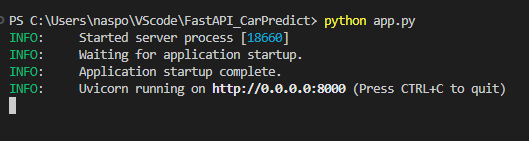

### transformer.py

In [5]:
from sklearn.base import BaseEstimator, TransformerMixin


class CombinedTransformer(BaseEstimator, TransformerMixin):

    def __init__(self, threshold):
        self.threshold = threshold
        self.value_counts_ = None
        self.unique_brands_ = set()

    def fit(self, X, y=None):
        # заполнение пропусков медианой
        self.medians_ = X.select_dtypes(include=["float64", "int64"]).median()
        # подсчет брендов
        self.value_counts_ = X["name"].apply(
            lambda x: x.split(" ")[0]).value_counts()
        self.unique_brands_ = set(self.value_counts_.index)
        return self

    def transform(self, X):
        # преобразование категориальных данных
        for col in ["mileage", "engine", "max_power"]:
            X[col] = X[col].fillna("").str.extract("(\d+\.?\d*)").astype(float)

        X[["torque", "max_torque_rpm"]] = (X["torque"].str.replace(
            ",",
            "").str.extract(r"^([\d.,]+).*?([\d.,]+)(?=\D*$)").astype(float))

        # заполнение пропусков
        X[X.select_dtypes(
            include=["float64", "int64"]).columns] = X.select_dtypes(
                include=["float64", "int64"]).apply(
                    lambda x: x.fillna(x.median()))

        # преобразование типов
        X["engine"] = X["engine"].astype(int)
        X["seats"] = X["seats"].astype(int)

        # извлечение марки
        X["brand"] = X["name"].apply(lambda x: x.split(" ")[0])
        X["brand"] = X["brand"].apply(
            lambda x: (x if (x in self.unique_brands_ and self.value_counts_.
                             get(x, 0) >= self.threshold) else "Other"))
        X = X.drop(columns=["name"])

        # создание новых признаков
        X["power_per_litre"] = X["max_power"] / X["engine"]
        X["km_per_year"] = X["km_driven"] / (2024 - X["year"])
        X["is_first_owner"] = X["owner"].apply(lambda x: 1
                                               if x == "First Owner" else 0)
        X["is_test_drive_car"] = X["owner"].apply(
            lambda x: 1 if x == "Test Drive Car" else 0)
        return X


### Тестирование API

In [ ]:
# предикт 1 машины
import pandas as pd
import requests

df = pd.read_csv('file.csv')
url = "http://localhost:8000/predict_item"
response = requests.post(url, json=df.sample(n=1).iloc[0].to_dict())

if response.status_code == 200:
    print("Predicted price:", response.json())
else:
    print("Error:", response.status_code, response.text)

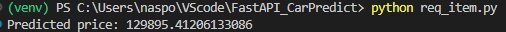

In [ ]:
# предикт для нескольких машин
import requests
import pandas as pd
import numpy as np

df = pd.read_csv('file.csv').dropna()
items = []
for index, row in df.iterrows():
    item = {
        "name": row['name'],
        "year": row['year'],
        "selling_price": row['selling_price'],
        "km_driven": row['km_driven'],
        "fuel": row['fuel'],
        "seller_type": row['seller_type'],
        "transmission": row['transmission'],
        "owner": row['owner'],
        "mileage": row['mileage'],
        "engine": row['engine'],
        "max_power": row['max_power'],
        "torque": row['torque'],
        "seats": row['seats']
    }
    items.append(item)

payload = {
    "items": items
}

url = "http://localhost:8000/predict_items"
response = requests.post(url, json=payload)

if response.status_code == 200:
    print(response.text)
else:
    print("Error:", response.status_code, response.text)

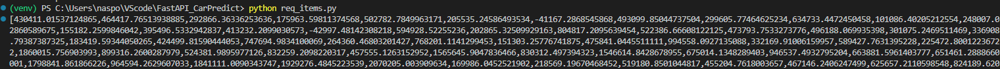

In [ ]:
# предикт для csv
import requests
import pandas as pd
from io import StringIO

url = "http://localhost:8000/predict_csv"
files = {'file': open('file.csv', 'rb')}

response = requests.post(url, files=files)

df = pd.read_csv(StringIO(response.content.decode('utf-8')), header=None)

print(df.head())

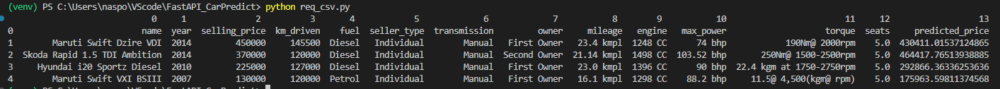

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией

3. Просматривает ноутбук с DS частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/Kz1ZRWj)

</details>